In [1]:
#Подключаем необходимые библиотеки
import numpy as np
import pandas as pd

import plotly.graph_objects as go
import plotly.express as px

from scipy.stats import shapiro
from sklearn.neighbors import LocalOutlierFactor

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

In [2]:
# Настроим отображение pandas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

<h2>Первичный анализ</h2>

In [3]:
#Прочитаем датасет
course_df = pd.read_excel('./data/course_data.xlsx')

In [4]:
#Выведем основую информацию о датасете
display(course_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001 entries, 0 to 1000
Columns: 214 entries, Unnamed: 0 to fr_urea
dtypes: float64(107), int64(107)
memory usage: 1.6 MB


None

Датасет содержит 1001 запись и 214 полей

In [5]:
#Выведем первые и последние 5 строк
display(course_df.head(5))
display(course_df.tail(5))

,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA8,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA9,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,fr_Al_COO,fr_Al_OH,fr_Al_OH_noTert,fr_ArN,fr_Ar_COO,fr_Ar_N,fr_Ar_NH,fr_Ar_OH,fr_COO,fr_COO2,fr_C_O,fr_C_O_noCOO,fr_C_S,fr_HOCCN,fr_Imine,fr_NH0,fr_NH1,fr_NH2,fr_N_O,fr_Ndealkylation1,fr_Ndealkylation2,fr_Nhpyrrole,fr_SH,fr_aldehyde,fr_alkyl_carbamate,fr_alkyl_halide,fr_allylic_oxid,fr_amide,fr_amidine,fr_aniline,fr_aryl_methyl,fr_azide,fr_azo,fr_barbitur,fr_benzene,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,0,0.038844,-0.293526,0.293526,0.038844,0.642857,1.035714,1.321429,14.822266,9.700470,2.600532,-2.343082,2.644698,-2.322229,5.944519,0.193481,3.150503,1.164038,611.920301,20.208896,19.534409,19.534409,13.127794,12.204226,12.204226,12.058078,12.058078,10.695991,10.695991,7.340247,7.340247,-0.66,2.187750e+06,20.606247,6.947534,2.868737,173.630124,0.000000,0.0,0.0,0.0,0.0,0.0,9.984809,0.0,0.0,0.0,54.384066,74.032366,35.342864,0.000000,0.000000,11.423370,0.0,0.000000,43.480583,105.750639,13.089513,0.00000,0,0.0,0.000000,0.000000,0.0,0.0,24.512883,0.000000,33.495774,105.750639,9.984809,0.0,0.0,0,24.72,0.0,0.0,0.0,0.000000,21.659962,24.925325,64.208216,11.42337,0.0,41.542423,9.984809,0.00000,0.0,10.188192,0.000000,4.807589,1.764908,0.000000,13.258223,16.981087,0.000000,0.923077,28,0,2,4,0,4,0,0,0,2,0,2,7,4,0,4,4,7.1212,121.5300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0
1,1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,0,0.012887,-0.313407,0.313407,0.012887,0.607143,1.000000,1.285714,14.975110,9.689226,2.614066,-2.394690,2.658342,-2.444817,5.134527,0.120322,3.150503,1.080362,516.780124,20.208896,19.794682,19.794682,13.127794,12.595754,12.595754,12.648545,12.

,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA8,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA9,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,fr_Al_COO,fr_Al_OH,fr_Al_OH_noTert,fr_ArN,fr_Ar_COO,fr_Ar_N,fr_Ar_NH,fr_Ar_OH,fr_COO,fr_COO2,fr_C_O,fr_C_O_noCOO,fr_C_S,fr_HOCCN,fr_Imine,fr_NH0,fr_NH1,fr_NH2,fr_N_O,fr_Ndealkylation1,fr_Ndealkylation2,fr_Nhpyrrole,fr_SH,fr_aldehyde,fr_alkyl_carbamate,fr_alkyl_halide,fr_allylic_oxid,fr_amide,fr_amidine,fr_aniline,fr_aryl_methyl,fr_azide,fr_azo,fr_barbitur,fr_benzene,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
996,996,31.000104,34.999650,1.129017,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,414.542,380.270,414.240624,164,0,0.317890,-0.468587,0.468587,0.317890,1.133333,1.866667,2.533333,16.586886,9.344314,2.726237,-2.677345,2.739076,-2.646743,5.980114,-0.196385,3.023764,1.646946,857.600295,21.637464,18.825334,18.825334,14.097861,11.665192,11.665192,11.409461,11.409461,10.058026,10.058026,8.981266,8.981266,-1.65,6.242348e+06,20.263719,6.198453,2.219273,178.490760,9.473726,0.000000,0.0,0.00000,0.0,17.907916,14.383612,0.000000,0.000000,0.0,38.841158,68.114460,5.414990,24.360600,23.857337,17.907916,0.0,0.000000,51.752408,66.219879,7.109798,11.649125,0,0.0,0.000000,0.0,0.0,0.000000,25.017713,23.857337,51.752408,66.219879,11.649125,0.0,0.0,0,69.67,5.414990,14.383612,0.0,52.409521,11.835812,38.524930,12.682902,0.000000,0.000000,33.770969,9.473726,10.503509,0.000000,38.515343,0.000000,0.498752,-0.405436,0.000000,7.985276,8.824371,1.494852,0.800000,30,0,5,5,1,6,0,0,0,5,0,5,2,3,1,4,6,4.3002,109.8350,0,0,0,0,0,0,0,0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1,0,0,0,3,2,0,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
997,997,31.999934,33.999415,1.062484,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,485.621,446.309,485.277738,192,0,0.327562,-0.467493,0.467493,0.327562,1.085714,1.800000,2.457143,16.586914,9.343622,2.725543,-2.679467,2.738755,-2.655659,5.980828,-0.187625,3.130958,1.535171,1016.917688,25.4

Поле <b>Unnamed: 0</b> содержит индекс строки.</br>
Данное поле для расчетов не нужно.

In [6]:
#Удаление поля "Unnamed: 0"
course_df.drop('Unnamed: 0', axis=1, inplace=True)

In [7]:
#Проверим наличие пропусков в данных
print('Количество пропущеных ячеек', course_df.isna().sum().sum())
print('Количество строк с пропусками', course_df.shape[0] - course_df.dropna().shape[0])
print('Колонки с пропусками:')
columns_with_null = course_df.columns[course_df.isnull().any()]
for column_name in columns_with_null:
    print(f'• {column_name}')

Количество пропущеных ячеек 36
Количество строк с пропусками 3
Колонки с пропусками:
• MaxPartialCharge
• MinPartialCharge
• MaxAbsPartialCharge
• MinAbsPartialCharge
• BCUT2D_MWHI
• BCUT2D_MWLOW
• BCUT2D_CHGHI
• BCUT2D_CHGLO
• BCUT2D_LOGPHI
• BCUT2D_LOGPLOW
• BCUT2D_MRHI
• BCUT2D_MRLOW


Так как во всем датасете пропуски есть только в 3х строках, можем ими пренебречь и удалить.

In [8]:
#Удаляем строки с пропусками
course_df.dropna(axis=0, inplace=True)
print('Размерность датасета после удаления =', course_df.shape)

Размерность датасета после удаления = (998, 213)


In [146]:
#Попробуем заменить на медианное значение
#course_df.fillna(course_df.median(), inplace=True)
#Замена не медианное значение ухудшает метрики

In [9]:
not_uniq_features = list()

print('Количество уникальных значений в признаках:')
for colname in course_df.columns:
    uniq_count = course_df[colname].nunique()
    print('{0:25} - {1}'.format(colname, uniq_count))
    if uniq_count <= 1:
        not_uniq_features.append(colname)

print(f'\nКоличество признаков с одним значением: {len(not_uniq_features)}')

Количество уникальных значений в признаках:
IC50, mM                  - 950
CC50, mM                  - 885
SI                        - 767
MaxAbsEStateIndex         - 791
MaxEStateIndex            - 791
MinAbsEStateIndex         - 788
MinEStateIndex            - 794
qed                       - 756
SPS                       - 595
MolWt                     - 710
HeavyAtomMolWt            - 603
ExactMolWt                - 691
NumValenceElectrons       - 112
NumRadicalElectrons       - 1
MaxPartialCharge          - 722
MinPartialCharge          - 654
MaxAbsPartialCharge       - 662
MinAbsPartialCharge       - 719
FpDensityMorgan1          - 278
FpDensityMorgan2          - 332
FpDensityMorgan3          - 353
BCUT2D_MWHI               - 802
BCUT2D_MWLOW              - 802
BCUT2D_CHGHI              - 802
BCUT2D_CHGLO              - 802
BCUT2D_LOGPHI             - 802
BCUT2D_LOGPLOW            - 802
BCUT2D_MRHI               - 802
BCUT2D_MRLOW              - 802
AvgIpc                    - 64

Проанализировав признаки на уникальные значения, получаем, что в 18 признаках имеется всего одно значение. Следовательно данные признаки неинформативны для вычисления и их можно удалить.

In [10]:
#Удаление признаков с единственным уникальным значением
course_df.drop(not_uniq_features, axis=1, inplace=True)
print('Размерность датасета после удаления =', course_df.shape)

Размерность датасета после удаления = (998, 195)


In [11]:
#Выведем основные статистические показатели
display(course_df.describe().T)

,count,mean,std,min,25%,50%,75%,max
"IC50, mM",998.0,2.211188e+02,4.005107e+02,3.516694e-03,12.491340,45.992006,2.244086e+02,4.128529e+03
"CC50, mM",998.0,5.866684e+02,6.420165e+02,7.008079e-01,99.999036,408.793314,8.917710e+02,4.538976e+03
SI,998.0,7.265000e+01,6.855043e+02,1.148927e-02,1.457233,3.856410,1.652500e+01,1.562060e+04
MaxAbsEStateIndex,998.0,1.082929e+01,3.312200e+00,2.321942e+00,9.050397,12.187546,1.317221e+01,1.593346e+01
MaxEStateIndex,998.0,1.082929e+01,3.312200e+00,2.321942e+00,9.050397,12.187546,1.317221e+01,1.593346e+01
MinAbsEStateIndex,998.0,1.808884e-01,1.688602e-01,3.921013e-05,0.051003,0.124656,2.916785e-01,1.374614e+00
MinEStateIndex,998.0,-9.663299e-01,1.590258e+00,-6.992796e+00,-1.332714,-0.419485,6.548222e-02,1.374614e+00
qed,998.0,5.811792e-01,2.120814e-01,5.956678e-02,0.442842,0.635772,7.424828e-01,9.472648e-01
SPS,998.0,2.953985e+01,1.272656e+01,9.416667e+00,18.533333,29.374328,3.880114e+01,6.027273e+01
MolWt,998.0,3.485250e+02,1.270458e+02,1.101560e+02,264.321000,315.457000,4.094353e+02,9.047770e+02


<h2>Анализ выбросов в таргетах</h2>

После того, как определили ключевые признаки для таргетов, проверим записи на наличие выбросов

In [12]:
#Опишем функцию для проверки нормальности распределения
def check_normal(iDataFrame, iFeature, iAlpha = 0.5):
    stat, p_value = shapiro(iDataFrame[iFeature])

    if p_value > iAlpha:
        print(f"Данные в признаке \"{iFeature}\" распределены нормалньо")
    else:
        print(f"Данные в признаке \"{iFeature}\" распределены НЕ нормалньо")

In [14]:
#Проверим таргеты на нормальность распределения
check_normal(course_df, 'IC50, mM')
check_normal(course_df, 'CC50, mM')
check_normal(course_df, 'SI')

Данные в признаке "IC50, mM" распределены НЕ нормалньо
Данные в признаке "CC50, mM" распределены НЕ нормалньо
Данные в признаке "SI" распределены НЕ нормалньо


Так как данные во всех трёх таргетах распределены не нормально, то для вычисления выбросов воспользуемся методом межквартильного размаха. Также для поиска аномальных значений воспользуемся LocalOutlierFactor

In [15]:
#Опишем функцию для вывода распределения и границ доверительного интервала
def show_outliers_iqr(iData, iFeature, iLeft=1.5, iRight=1.5):
    data = iData[iFeature]

    lof_data = np.array(data).reshape(len(data), 1)
    lof = LocalOutlierFactor(n_neighbors=150, contamination=0.01, metric='euclidean')
    outliers = lof.fit_predict(lof_data)

    fig = px.histogram(
        data_frame=data,
        x=iFeature,
        color=outliers,
        height=500,
        width=1100,
        title=f'Гистограмма распределения {iFeature}',
        marginal='box'
    )
    
    quartile_1, quartile_3 = data.quantile(0.25), data.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * iLeft)
    upper_bound = quartile_3 + (iqr * iRight)
    
    fig.add_vline(data.mean(), line_width=3, line_dash="dash", line_color="green")
    #Добавим границы квартилей
    fig.add_vline(lower_bound, line_width=3, line_color="red")
    fig.add_vline(upper_bound, line_width=3, line_color="red")
    
    fig.show()

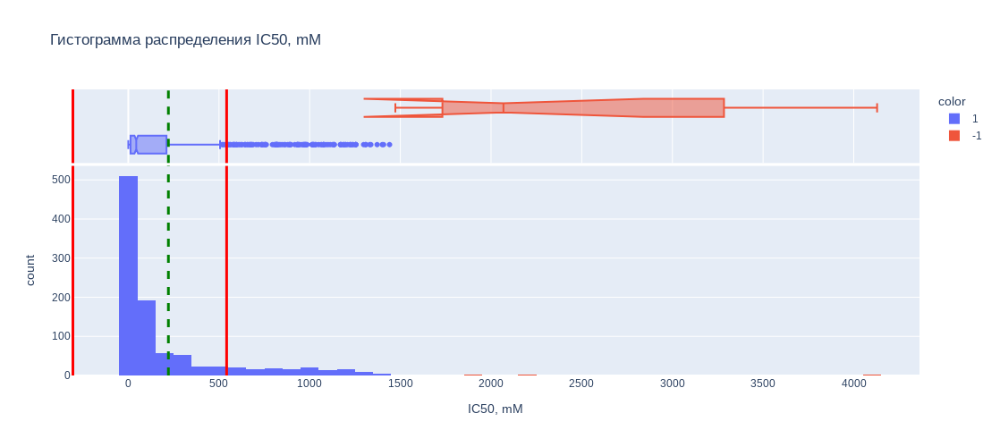

In [16]:
show_outliers_iqr(course_df, 'IC50, mM')

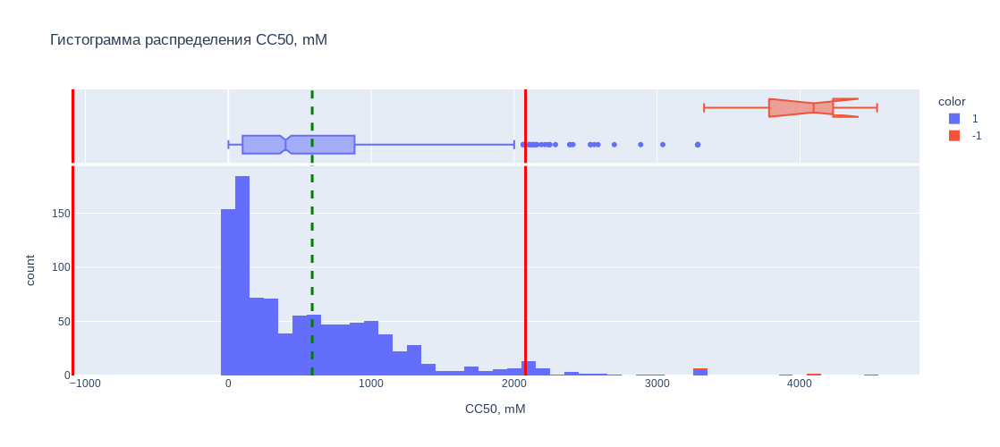

In [17]:
show_outliers_iqr(course_df, 'CC50, mM')

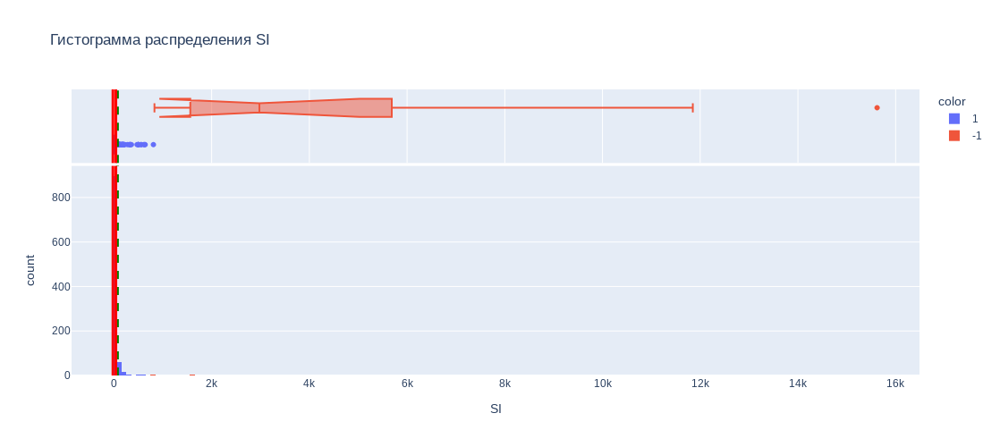

In [18]:
show_outliers_iqr(course_df, 'SI')

Описание графика:

* Зеленая пунктирная линия - среднее значение выборки;
* Красные сплошные линии - доверительный интервал по методу межквартильного размаха;
* Красные стобцы - аномальные выбросы по методу LocalOutlierFactor.

Из приведенных графиков видно, что статистические выбросы присутствуют во всех таргетах.</br>
Проанализируем каждый признак на наличие аномальных выбросов.

In [19]:
def show_outliers(iData, iFeature):
    data = iData[iFeature]

    lof_data = np.array(data).reshape(len(data), 1)
    lof = LocalOutlierFactor(n_neighbors=150, contamination=0.01, metric='euclidean')
    outliers = lof.fit_predict(lof_data)

    if len(outliers) > 0:
        print(iFeature)
        px.histogram(
            data_frame=data,
            x=iFeature,
            color=outliers,
            height=500,
            width=1100,
            title=f'Гистограмма распределения {iFeature}',
            marginal='box'
        ).show()

In [27]:
#Закомментированно, так как занимает много места
# for colname in course_df.columns:
#     show_outliers(course_df, colname)

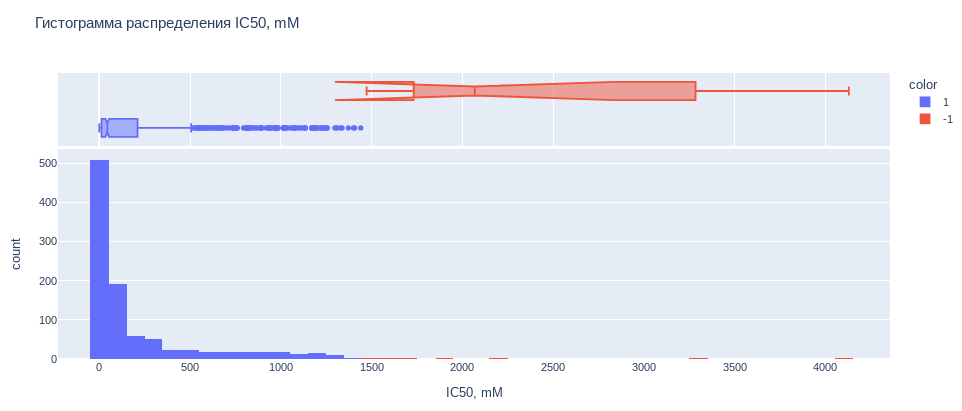
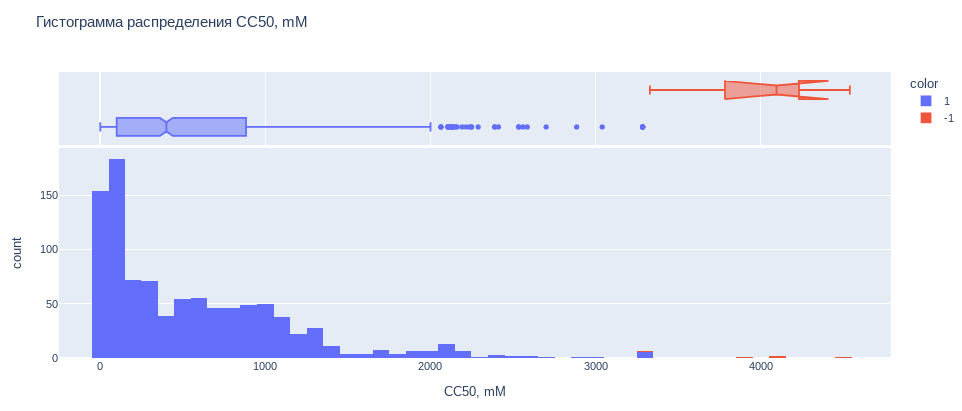
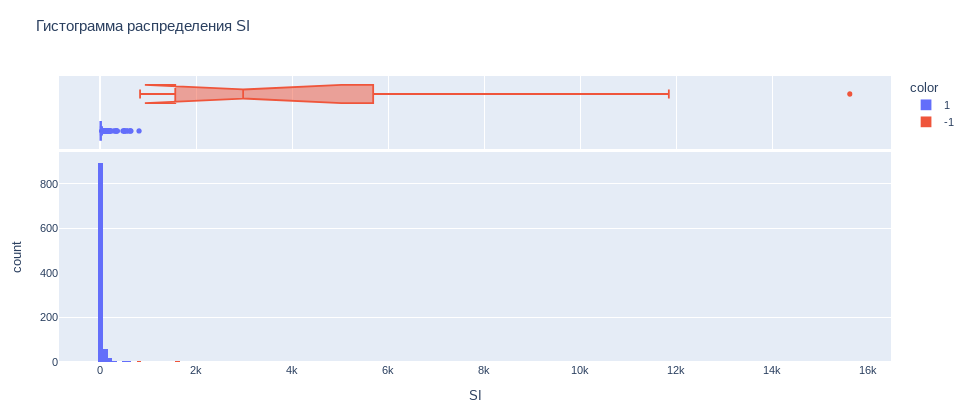
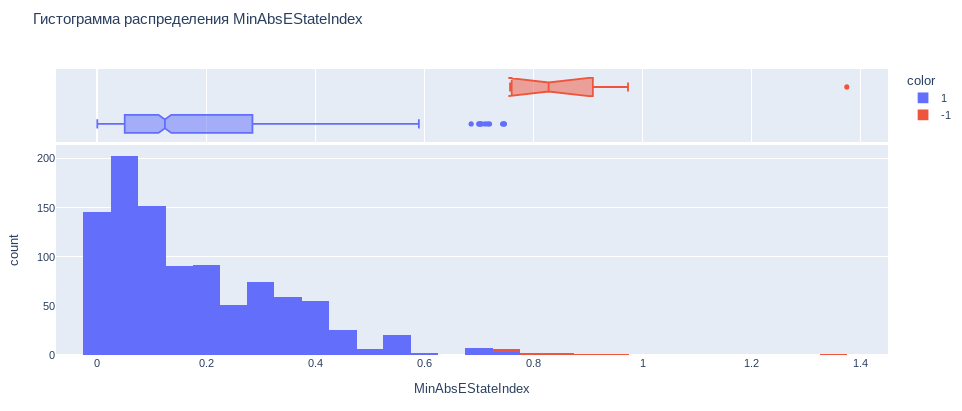
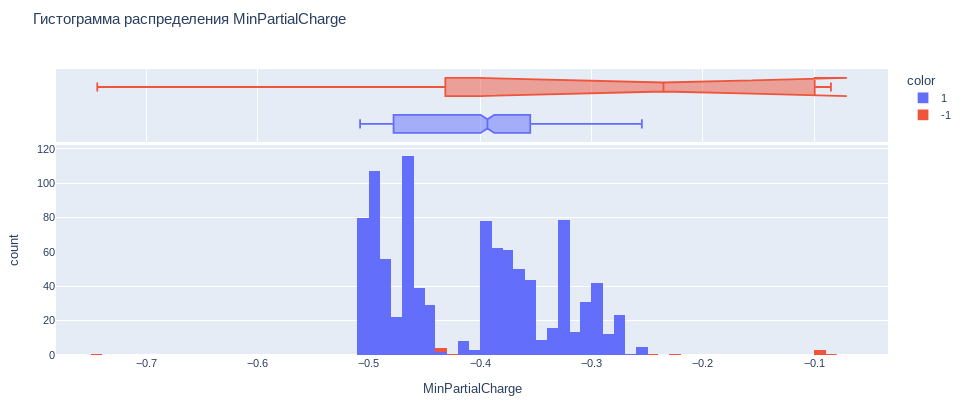
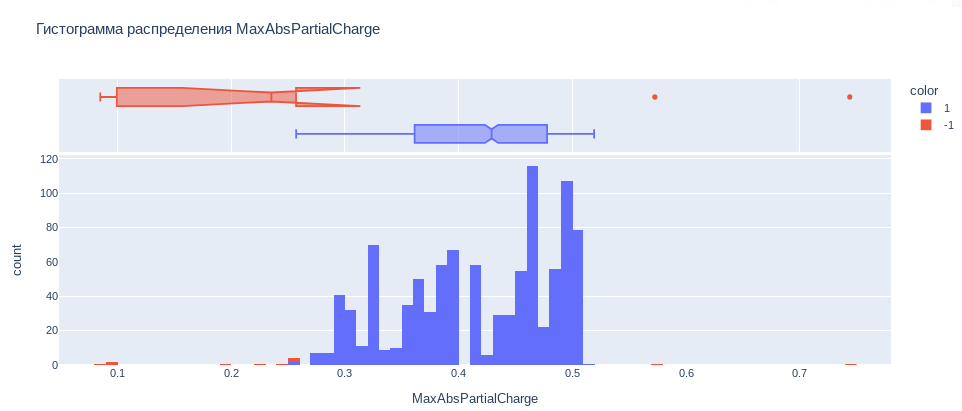
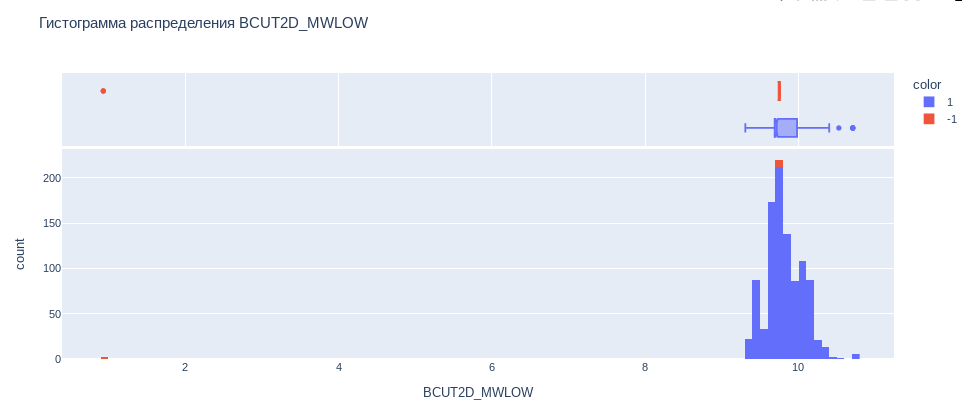
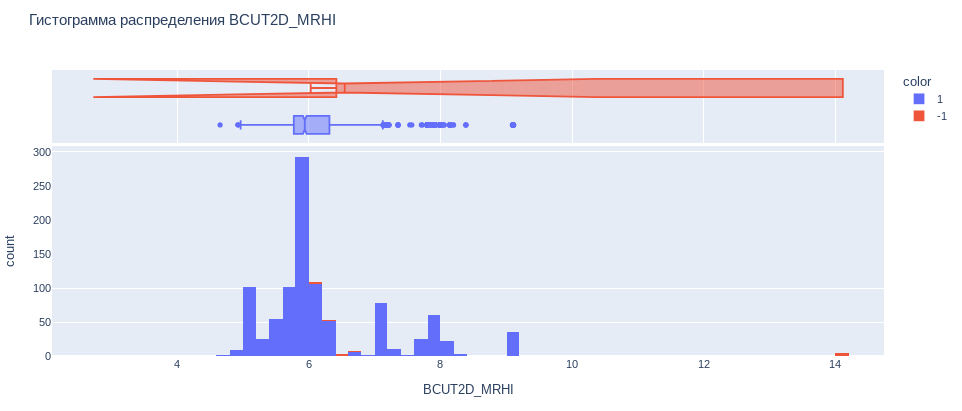
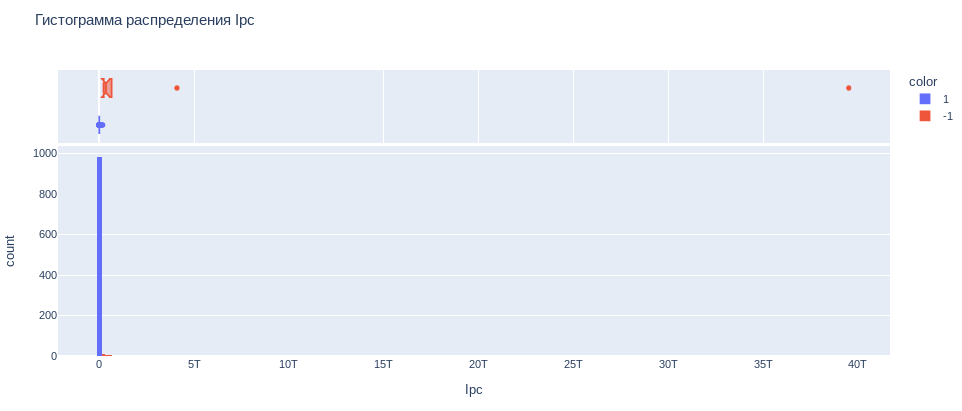
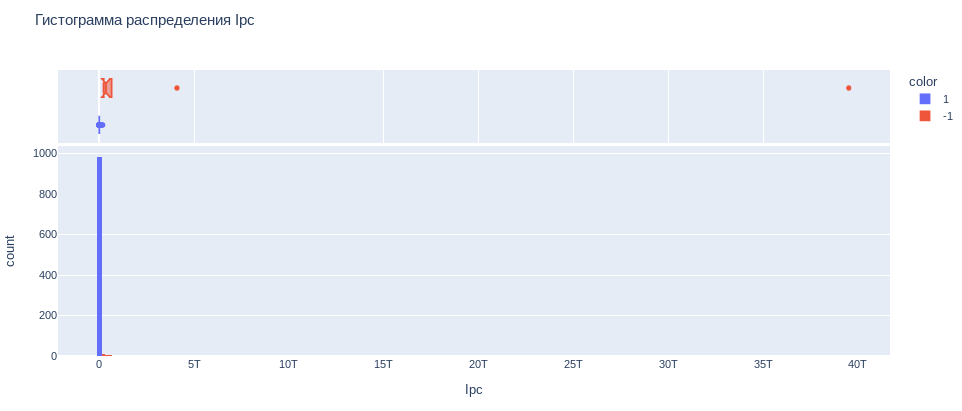

Просмотрев все графики распределения можно предположить, что у признаков есть выбросы:

* IC50, mM > 2500
* CC50, mM > 4000
* SI > 800
* MinAbsEStateIndex > 1
* MinPartialCharge > -0.2 и <-0.7
* MaxAbsPartialCharge > 0.5
* BCUT2D_MWLOW < 2
* BCUT2D_MRHI > 13
* Ipc > 1 * 10**12
* SMR_VSA2 > 5

In [161]:
print(len(course_df))

998


In [162]:
# Пробуем удалить выбросы
course_df.drop(
    course_df[
        course_df['IC50, mM'] > 2500
    ]['IC50, mM'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

995


In [163]:
course_df.drop(
    course_df[
        course_df['CC50, mM'] > 4000
    ]['CC50, mM'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

994


In [164]:
course_df.drop(
    course_df[
        course_df['SI'] > 800
    ]['SI'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

983


In [165]:
course_df.drop(
    course_df[
        course_df['MinAbsEStateIndex'] > 1
    ]['MinAbsEStateIndex'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

982


In [166]:
course_df.drop(
    course_df[
        (course_df['MinPartialCharge'] > -0.2 ) | (course_df['MinPartialCharge'] < -0.7)
    ]['MinPartialCharge'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

977


In [167]:
course_df.drop(
    course_df[
        course_df['MaxAbsPartialCharge'] > 0.5
    ]['MaxAbsPartialCharge'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

897


In [168]:
course_df.drop(
    course_df[
        course_df['BCUT2D_MWLOW'] <2
    ]['BCUT2D_MWLOW'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

895


In [169]:
course_df.drop(
    course_df[
        course_df['BCUT2D_MRHI'] > 13
    ]['BCUT2D_MRHI'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

891


In [170]:
course_df.drop(
    course_df[
        course_df['Ipc'] > 1 * 10**12
    ]['Ipc'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

890


In [171]:
course_df.drop(
    course_df[
        course_df['SMR_VSA2'] > 15
    ]['SMR_VSA2'].index,
    axis=0,
    inplace=True
)
print(len(course_df))

890


<h2>Анализ корреляций в признаках</h2>

In [172]:
#Опишем функцию вывода матрицы корреляции
def show_corr_heatmap(iDataFrame):
    df_corr = iDataFrame.corr()  

    fig = go.Figure()  
    fig.add_trace(
        go.Heatmap(
            x = df_corr.columns,
            y = df_corr.index,
            z = np.array(df_corr),
            text=df_corr.values
        )
    )
    fig.update_layout(width=1100, height=1100)
    fig.show()  

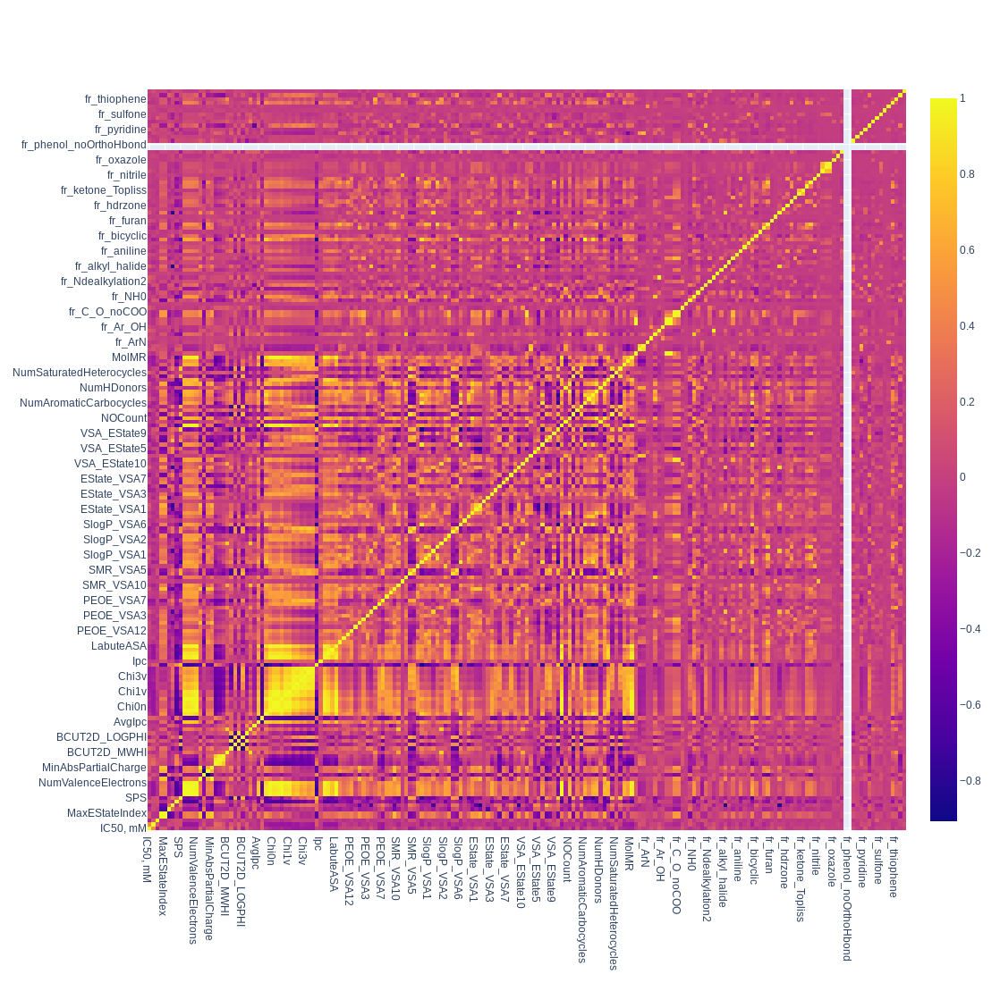

In [173]:
#Выведем матрицу корреляций
show_corr_heatmap(course_df)

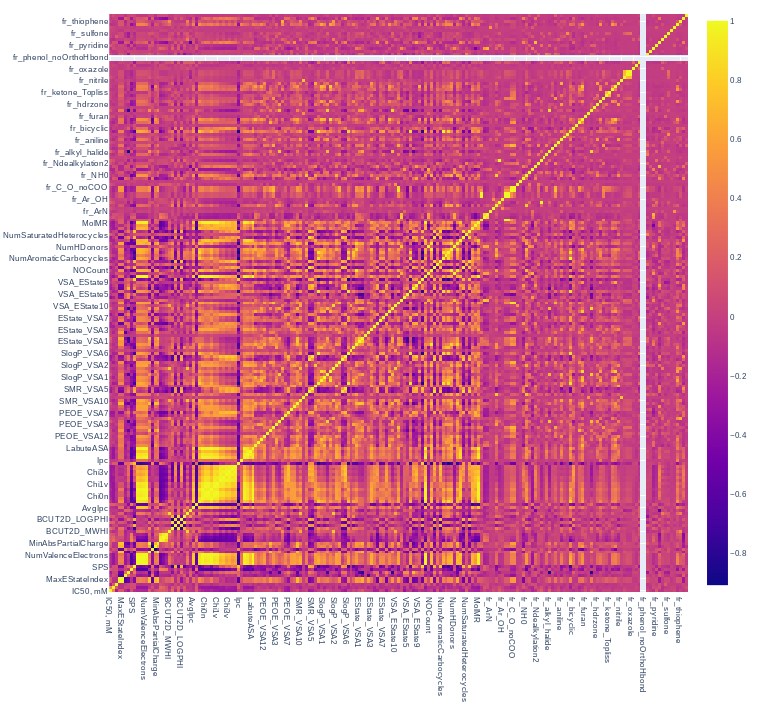

In [174]:
#Опишем функцию для получения значений корреляции по таргету
def get_corr_target(iDataFrame, iTarget_name):
    corr_df = iDataFrame.corr()
    result = corr_df[iTarget_name].abs().sort_values()
    #Исключаем поля всех таргетов
    result.drop(['IC50, mM', 'CC50, mM', 'SI'], inplace=True)
    return result

In [175]:
#Получим значения корреляций таргетов
IC50_corr = get_corr_target(course_df, 'IC50, mM')
CC50_corr = get_corr_target(course_df, 'CC50, mM')
SI_corr = get_corr_target(course_df, 'SI')

In [176]:
def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

In [177]:
def get_top_abs_correlations(df):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    return au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)

In [178]:
#Определим признаки которые сильно коррелируют между собой
top_corr = get_top_abs_correlations(course_df).reset_index()
display(top_corr)

,level_0,level_1,0
0,fr_COO,fr_COO2,1.000000
1,fr_Ar_NH,fr_Nhpyrrole,1.000000
2,MaxAbsEStateIndex,MaxEStateIndex,1.000000
3,NumAromaticCarbocycles,fr_benzene,1.000000
4,MolWt,ExactMolWt,0.999998
5,Chi1,HeavyAtomCount,0.998627
6,MolWt,HeavyAtomMolWt,0.996562
7,HeavyAtomMolWt,ExactMolWt,0.996524
8,Chi0,HeavyAtomCount,0.995670
9,NumValenceElectrons,Chi0,0.994938


Как видно из приведенного списка выше, имеется множество признаков, которые сильно коррелируют между собой. Удалим признаки, корреляция между которыми больше 0,95. При этом для каждого таргета, будем оставлять тот признак, корреляция с котором наибольшая.

In [179]:
#Опишем функцию для получения списка признаков с высокой корреляцией друг с другом
def get_drop_list_max_corr(iTop_corr, iTarget_corr):
    search_df = iTop_corr[
        iTop_corr[0] >= 0.95
    ]
    drop_list = list()
    
    for index, row in search_df.iterrows():
        feature_name1 = row['level_0']
        feature_name2 = row['level_1']
        if iTarget_corr.loc[feature_name1] > iTarget_corr.loc[feature_name2]:
            drop_list.append(feature_name2)
        else:
            drop_list.append(feature_name1)

    return list(set(drop_list))

In [180]:
#Сформируем датасет для таргета IC50, mM
drop_features = get_drop_list_max_corr(top_corr, IC50_corr)
IC50_df = course_df.drop(drop_features, axis=1)

#Сформируем датасет для таргета CC50, mM
drop_features = get_drop_list_max_corr(top_corr, CC50_corr)
CC50_df = course_df.drop(drop_features, axis=1)

#Сформируем датасет для таргета SI
drop_features = get_drop_list_max_corr(top_corr, SI_corr)
SI_df = course_df.drop(drop_features, axis=1)

После удаления одного из признаков с высокй корреляцией, заного посмотрим на тепловую карту, на примере таргета IC50, mM

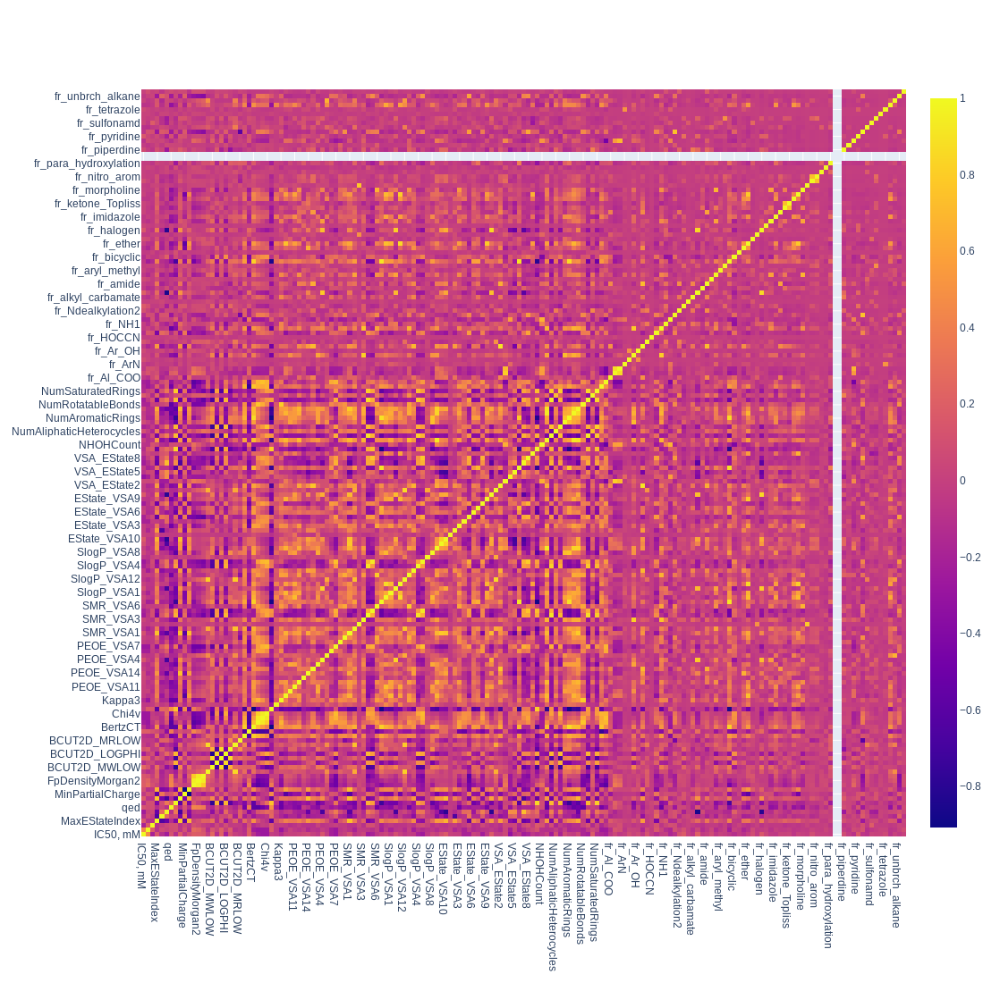

In [181]:
show_corr_heatmap(IC50_df)

Видно, что с тепловой карты пропали ярко выделяющиеся пятна, что свидетельствует о снижении количества признаков с высокой корреляцией между собой.

Далее рассмотрим корреляцию каждого признака с каждым таргетом.

In [182]:
IC50_corr = get_corr_target(IC50_df, 'IC50, mM')
CC50_corr = get_corr_target(CC50_df, 'CC50, mM')
SI_corr = get_corr_target(SI_df, 'SI')

In [183]:
#Опишем функцию для вывода графика корреляции
def show_corr_chart(iCorr, iTarget_name):
    chart_df = iCorr.reset_index()
    chart_df.columns = ['feature', 'corr']

    fig = px.bar(chart_df, x='feature', y='corr', title=f'Корреляция признаков к таргету {iTarget_name}')
    fig.show()

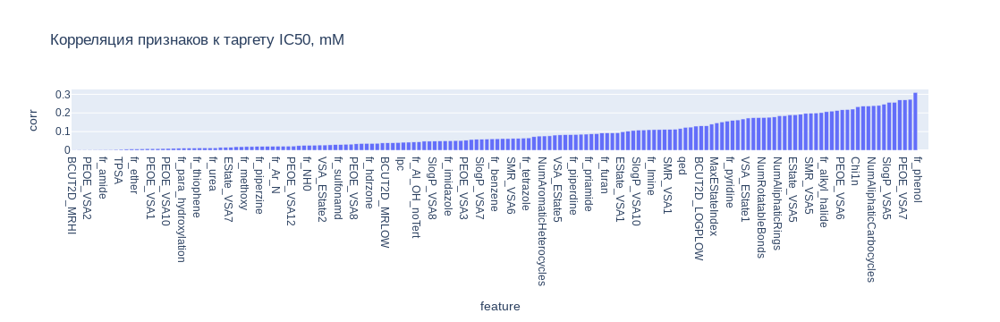

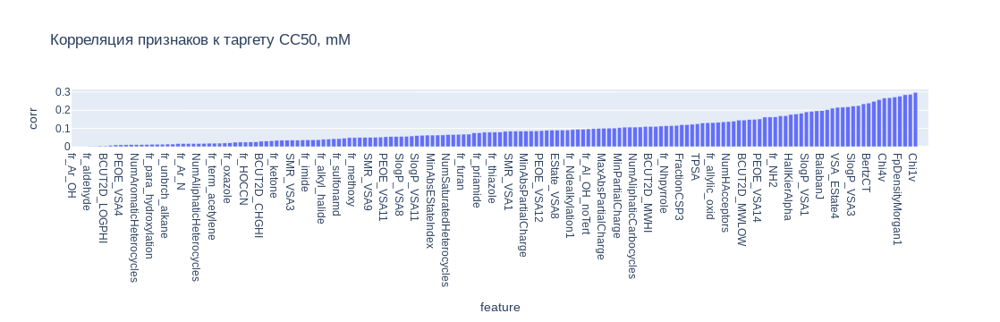

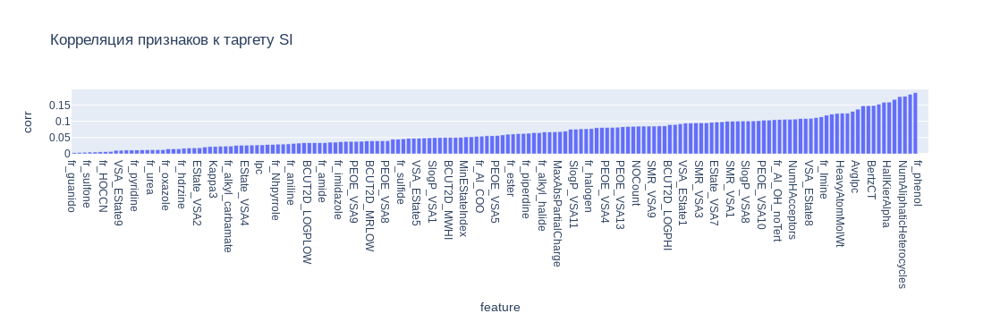

In [184]:
#Выведем графики корреляции для всех таргетов
show_corr_chart(IC50_corr, 'IC50, mM')
show_corr_chart(CC50_corr, 'CC50, mM')
show_corr_chart(SI_corr, 'SI')

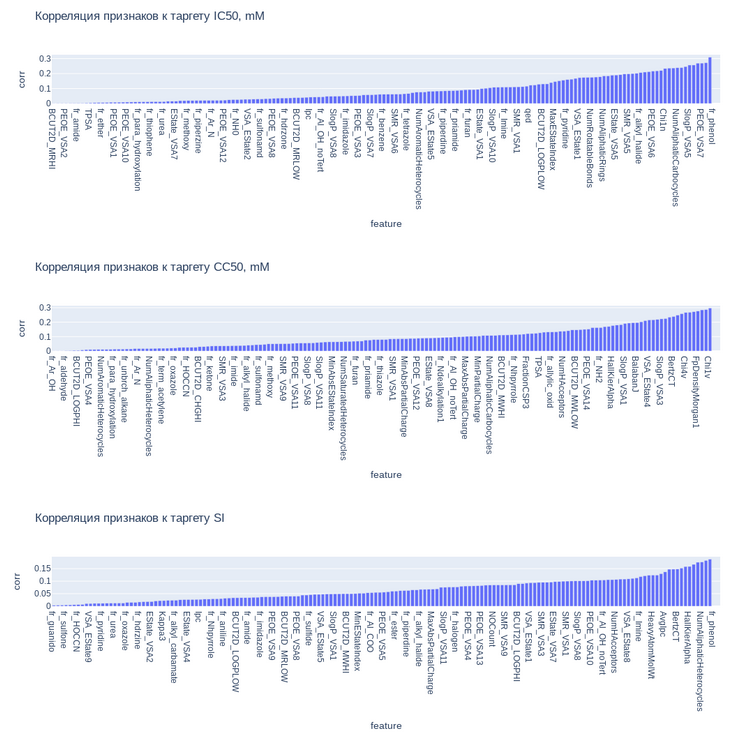

На основе построенных графиков можно сделать вывод что все признаки имеют слабую корреляцию (<= 0,3) к таргетам. Но при этом присутствуют как более коррелируемые, так и менее коррелируемые признаки.

<h2>Подбор признаков для каждого таргета</h2>

С помощью линейной регрессии определим оптимальное количество признаков.

In [185]:
def feature_line_reg(iData_frame, iTarget, iCorr):

    r2_score_list = list()
    feature_list = list()
    scaler = StandardScaler()

    iCorr = iCorr.sort_values(ascending=False)
    cor_df = iCorr.reset_index()

    #Поочередно будем добавлять признаки от большей корреляции к меньшей
    for feature in cor_df['index']:
        feature_list.append(feature)
        
        #Выполним стандартизацию данных
        features = scaler.fit_transform(iData_frame[feature_list])
        #Делим на тренировочние и тестовые данные
        X_train, X_test, y_train, y_test = train_test_split(features, iTarget, test_size=0.2, random_state=42)

        #Вычисляем таргет
        model = LinearRegression()
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        r2 = r2_score(y_test, y_pred)

        #Запишем результаты
        r2_score_list.append(round(r2, 3))

    return r2_score_list

In [186]:
def show_r2_chart(iR2_score, icount_feature, iTarget_name):
    fig = go.Figure()
    axis_x = list(range(1,icount_feature+1))

    fig.add_trace(go.Scatter(
        x = axis_x,
        y = iR2_score,
        mode = 'lines+markers',
        name = 'R2 score',
        line = dict(color='blue', width=2),
        marker = dict(size=6, color='blue')
    ))
    
    # Настраиваем оформление
    fig.update_layout(
        title = f'Показатели метрики R2 для {iTarget_name}',
        xaxis_title = 'Количество признаков',
        yaxis_title = 'R2',
        showlegend = True,
        width = 1100,
        height = 800
    )
    
    # Показываем график
    fig.show()

In [187]:
# С помощью линейно регрессии посчитаем R2 для IC50
r2_score_list = feature_line_reg(
    IC50_df.drop(['IC50, mM'], axis=1),
    IC50_df['IC50, mM'],
    IC50_corr
)

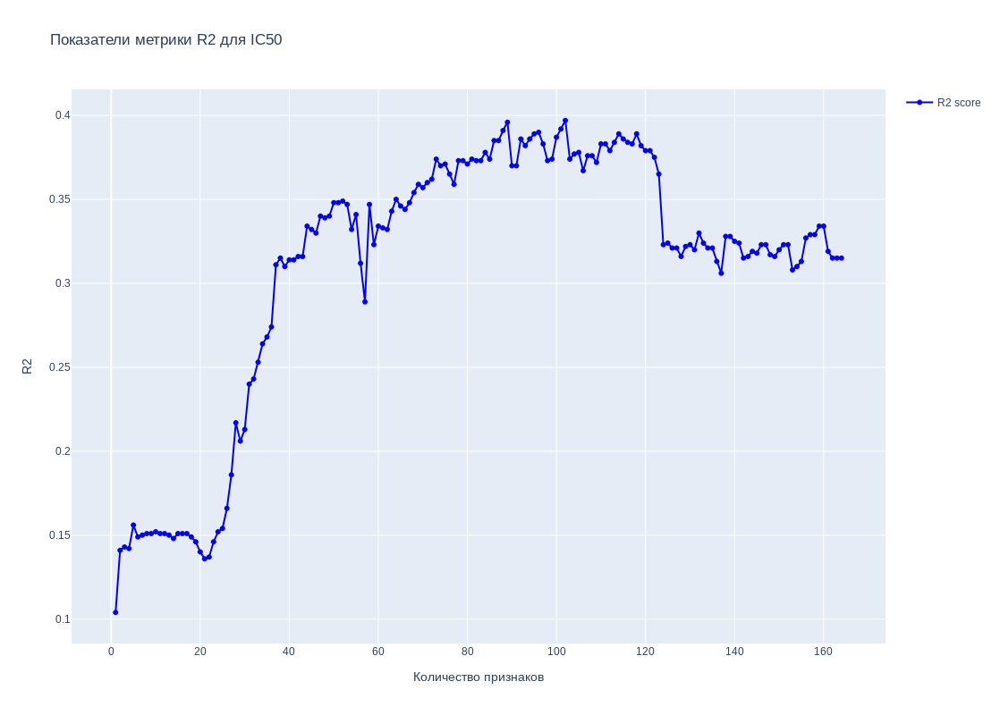

In [188]:
# Выведем график изменения R2
show_r2_chart(r2_score_list, 181, 'IC50')

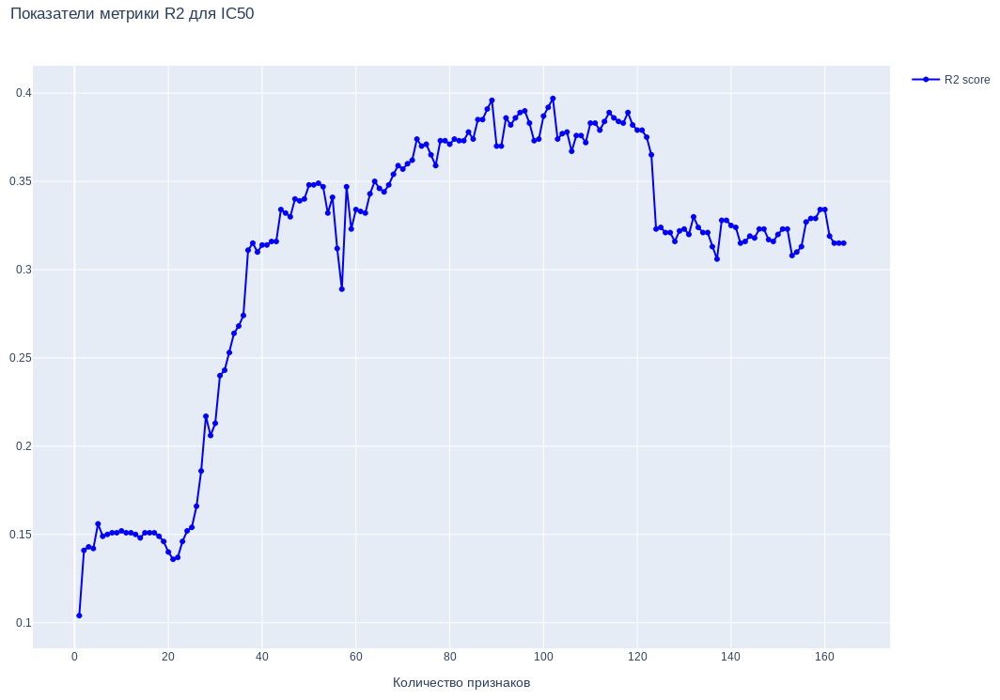

Как видно из графика, наилучший показатель R2 для таргета IC50 достигается при 104 признаков с наибольшей корреляцией.

In [189]:
# С помощью линейно регрессии посчитаем R2 для СC50
r2_score_list = feature_line_reg(
    CC50_df.drop(['CC50, mM'], axis=1),
    CC50_df['CC50, mM'],
    CC50_corr
)

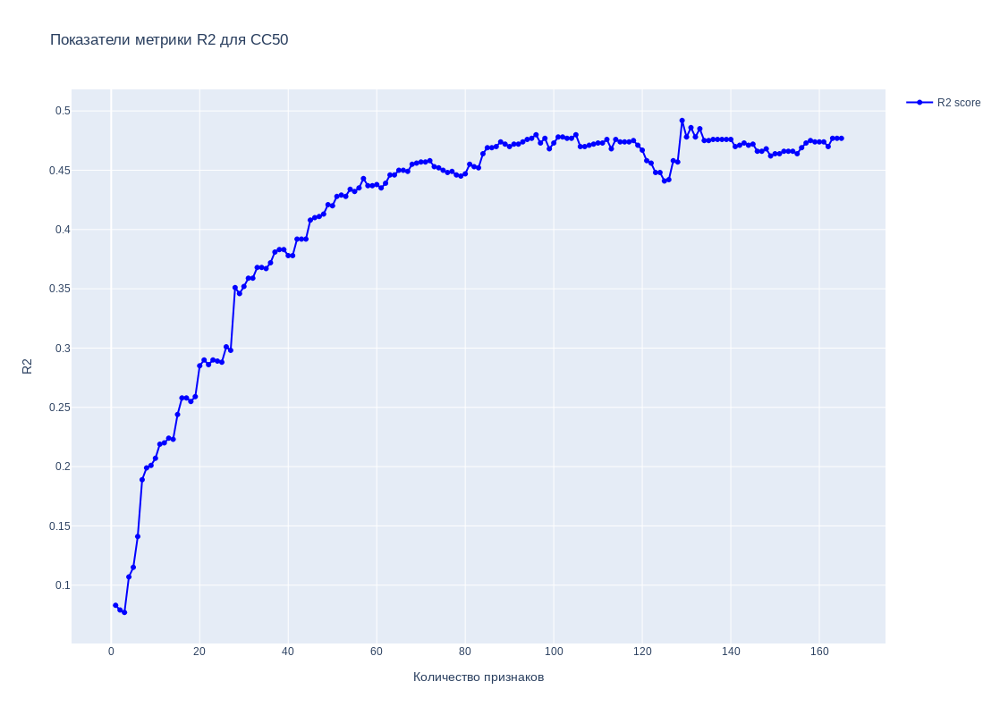

In [190]:
# Выведем график изменения R2
show_r2_chart(r2_score_list, 181, 'СC50')

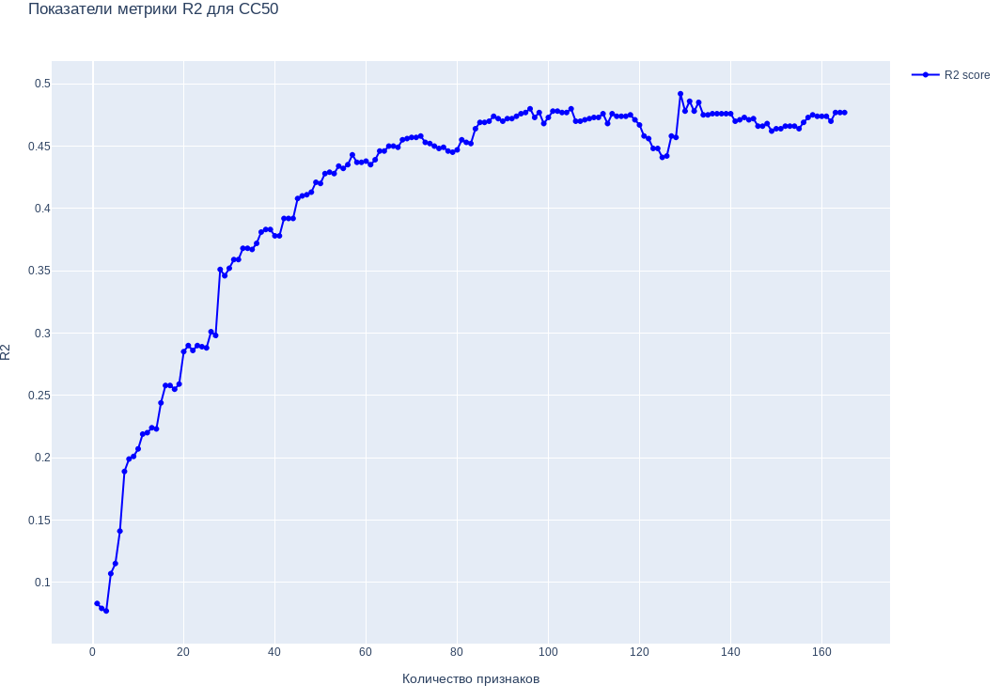

In [191]:
# С помощью линейно регрессии посчитаем R2 для СC50
r2_score_list = feature_line_reg(
    SI_df.drop(['SI'], axis=1),
    SI_df['SI'],
    SI_corr
)

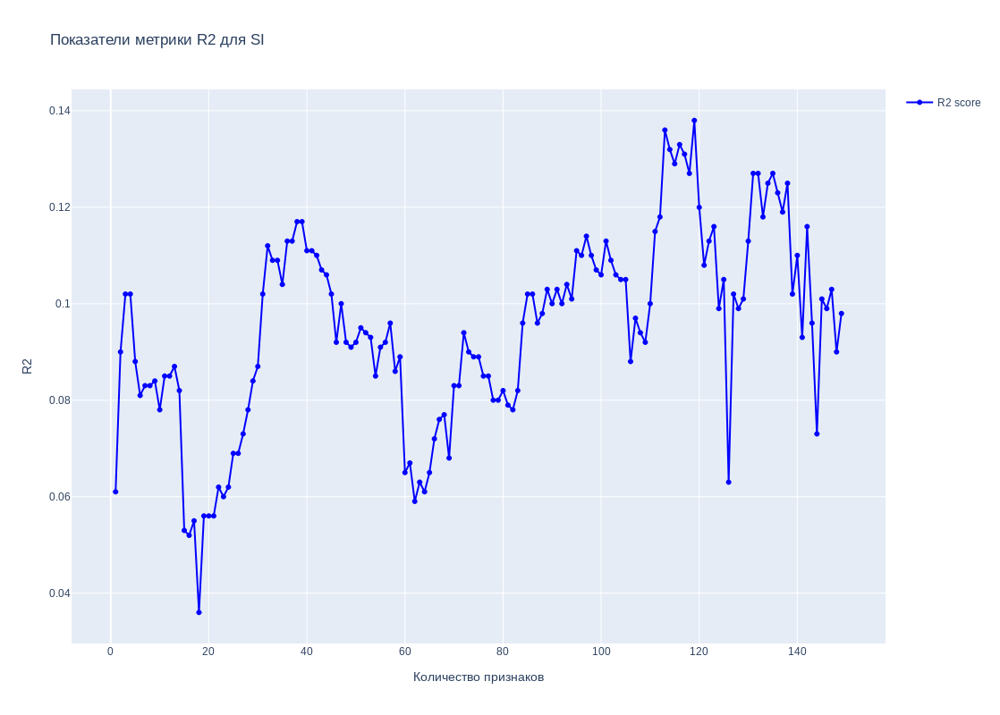

In [192]:
# Выведем график изменения R2
show_r2_chart(r2_score_list, 149, 'SI')

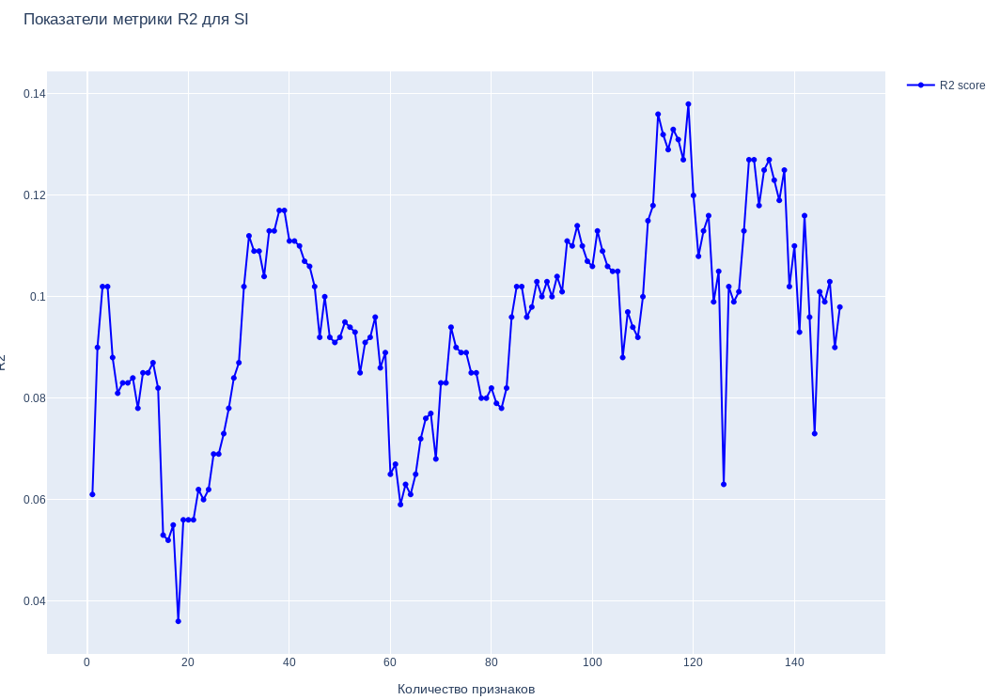

<b>Выводы по метрике R2:</b>

* Для таргета IC50 наилучший показатель R2 при 102 признаках с наибольшей корреляцией;
* Для таргета СС50 наилучший показатель R2 при 129 признаках с наибольшей корреляцией;
* Для таргета IS наилучший показатель R2 при 119 признаке с наибольшей корреляцией.

In [193]:
#Исходя из полученных данных скорректируем датасеты
cor_df = IC50_corr.sort_values(ascending=False).reset_index()
drop_features = list(cor_df.loc[103:len(cor_df)+1, 'index'])
IC50_df.drop(drop_features, axis=1, inplace=True)

In [194]:
cor_df = CC50_corr.sort_values(ascending=False).reset_index()
drop_features = list(cor_df.iloc[129:len(cor_df)+1]['index'])
CC50_df.drop(drop_features, axis=1, inplace=True)

In [195]:
cor_df = SI_corr.sort_values(ascending=False).reset_index()
drop_features = list(cor_df.iloc[120:len(cor_df)+1]['index'])
SI_df.drop(drop_features, axis=1, inplace=True)

In [196]:
#Удалим таргеты из датасетов
IC50_df.drop(['CC50, mM', 'SI'], axis=1, inplace=True)
CC50_df.drop(['IC50, mM', 'SI'], axis=1, inplace=True)
SI_df.drop(['IC50, mM', 'CC50, mM'], axis=1, inplace=True)

In [197]:
#Сохраним полученные датафреймы для дальнейшего построения модели
IC50_df.to_csv('./data/IC50.csv')

CC50_df.to_csv('./data/CC50.csv')

SI_df.to_csv('./data/SI.csv')

course_df.to_csv('./data/course.csv')